## Import libraries

In [1]:
%matplotlib inline
import io
import os
import numpy as np 
import leafmap
import geopandas as gpd 
import ipywidgets as widgets
from IPython.display import display
import pandas as pd 
from shapely.geometry import Polygon
import datacube
import sys
import folium
import rioxarray
import xarray as xr
import rasterio
from ipywidgets import interactive
import json
from ipywidgets import fixed


#Hide Warnings
import warnings
warnings.filterwarnings('ignore')

# Import functions and set auto-reload
from functions1 import *
%load_ext autoreload
%autoreload 2


## 1. Plotting of  original PRISMA & Sentinel-2  Images

### Select date for PRISMA and Sentinel-2 image

In [2]:
#Select Prisma image date
date_prisma_w = widgets.Dropdown(
    options=['2023-02-09', '2023-03-22', '2023-04-08', '2023-06-17', '2023-07-10', '2023-08-08'],
    value='2023-02-09',
    description='PRISMA date:',
    disabled=False,
    layout={'width': 'max-content'},
    style = {'description_width': 'initial'}
)
date_prisma_w

Dropdown(description='PRISMA date:', layout=Layout(width='max-content'), options=('2023-02-09', '2023-03-22', …

In [3]:
date_s2_w = widgets.Dropdown(
    options=['2023-02-10', '2023-03-22', '2023-04-26', '2023-06-25', '2023-07-10', '2023-08-19'],
    value='2023-02-10',
    description='Sentinel-2 date:',
    disabled=False,
    layout={'width': 'max-content'},
    style = {'description_width': 'initial'}
)
date_s2_w

Dropdown(description='Sentinel-2 date:', layout=Layout(width='max-content'), options=('2023-02-10', '2023-03-2…

###  List the product

In [4]:
# create data cube object and list the products
dc = datacube.Datacube(app = 'my_app', config = '/home/asi/datacube_conf/datacube.conf')
list_of_products = dc.list_products()
list_of_products

,name,description,license,default_crs,default_resolution
name,,,,,
PRISMA_Full_Bands,PRISMA_Full_Bands,PRISMA imagery containing all bands,None,None,None
PRISMA_classified_images,PRISMA_classified_images,PRISMA Classified images using scikit-learn Ra...,None,None,None
S2_Full_Bands,S2_Full_Bands,Sentinel-2 imagery containing all bands,None,None,None
Sentinel2_classified_images,Sentinel2_classified_images,Sentinel-2 Classified images using scikit-lear...,None,None,None
UCP,UCP,Urban Canopy Parameters,None,None,None
classified_images,classified_images,Classified images using scikit-learn Random Fo...,None,None,None
climami,climami,raster data retrived from CLIMAMI Project (Oss...,None,None,None
training_samples,training_samples,Training Samples for LCZ classification,None,None,None


In [5]:
# Load the PRISMA data
selected_date_str_PR = date_prisma_w.value
selected_date_PR = pd.to_datetime(selected_date_str_PR)
ds_PRISMA = dc.load(product = "PRISMA_Full_Bands", output_crs="epsg:32632", resolution=[30,30], time=(f'{selected_date_PR}T10:30:00.000000000'))


In [6]:
#Load the Sentinel-2 data
selected_date_str_S = date_s2_w.value
selected_date_S = pd.to_datetime(selected_date_str_S) 
ds_S2 = dc.load(product = "S2_Full_Bands", output_crs="epsg:32632", resolution=[20,20],time=(f'{selected_date_S}T10:30:00.000000000'))

In [7]:
# Load the Classified raster data for PRISMA
product_calssified = "PRISMA_classified_images"
ds_classified_PRI = dc.load(product = product_calssified, output_crs="epsg:32632", resolution=[30,30])

In [8]:
# load the Classified raster data for the sentinel-2
product_calssified = "Sentinel2_classified_images"
ds_classified_S2 = dc.load(product = product_calssified, output_crs="epsg:32632", resolution=[20,20])

###  Plot the original PRISMA image

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


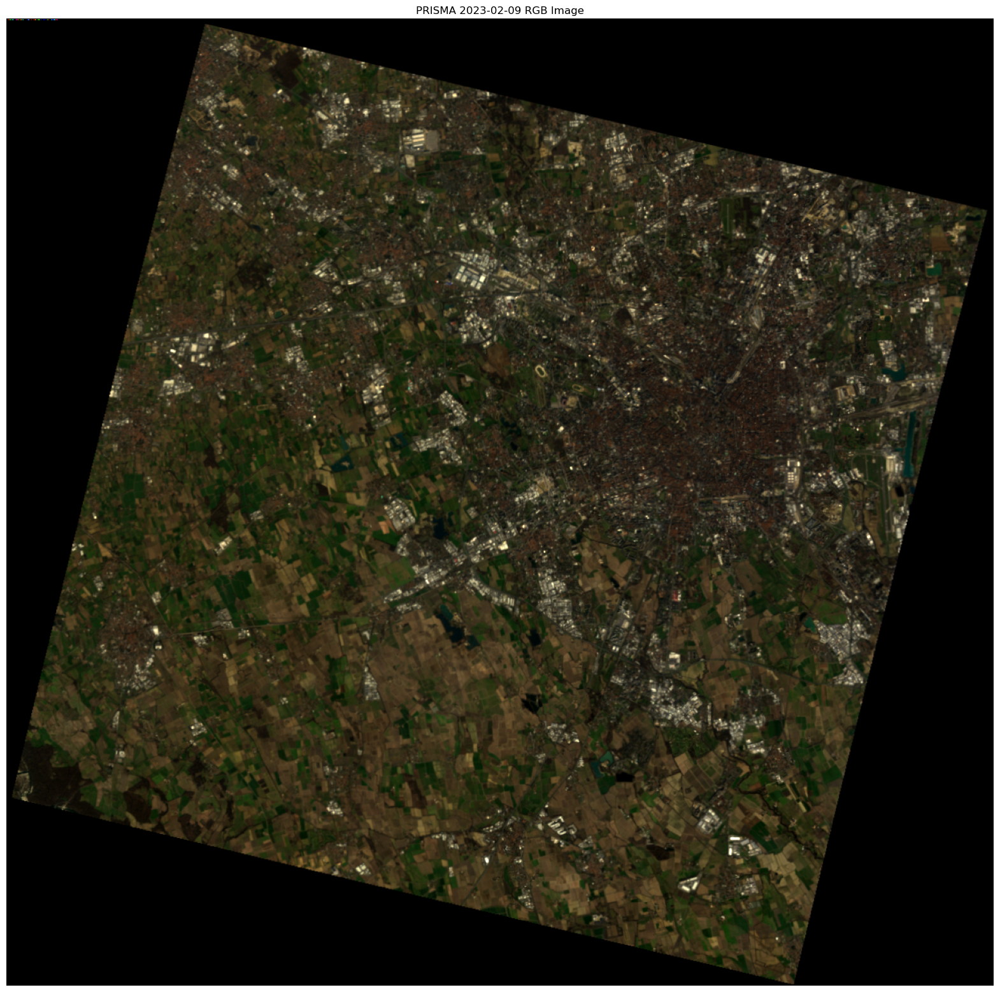

In [9]:
PRISMA_rgb_image(ds_PRISMA, selected_date_PR, selected_date_str_PR)

### 4/ Plot the orignal Sentinel-2  Image

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


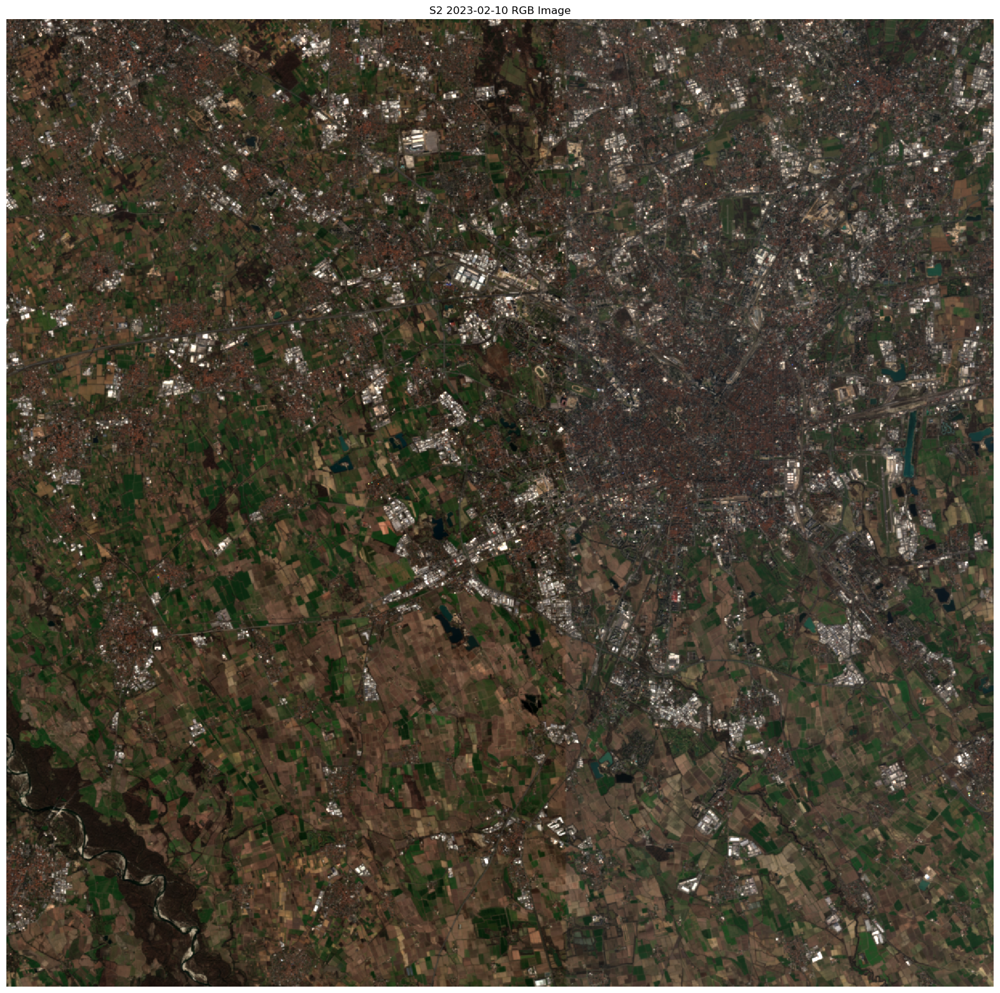

In [10]:
S2_rgb_image(ds_S2, selected_date_S, selected_date_str_S)

## 2. Plot the spectral signature for the training samples


### Select the sensor type and load the data

In [11]:
#select Sensor type 
Sensor = widgets.RadioButtons(
    options=['PRISMA', 'Sentinel-2'],
    value='PRISMA',  # Default to 'PRISMA'
    layout={'width': 'max-content'},
    description='Select Platform:',
    disabled=False
)
Sensor

RadioButtons(description='Select Platform:', layout=Layout(width='max-content'), options=('PRISMA', 'Sentinel-…

### Display an interactive map with the training samples 

In [12]:
legend = {
    2: ['Compact mid-rise', '#D10000'],
    3: ['Compact low-rise', '#CD0000'],
    5: ['Open mid-rise', '#FF6600'],
    6: ['Open low-rise', '#FF9955'],
    8: ['Large low-rise', '#BCBCBC'],
    101: ['Dense trees', '#006A00'],
    102: ['Scattered trees', '#00AA00'],
    104: ['Low plants', '#B9DB79'],
    105: ['Bare rock or paved', '#545454'],
    106: ['Bare soil or sand', '#FBF7AF'],
    107: ['Water', '#6A6AFF']
}
# import the geopackage
extent_gpkg_path = '/home/asi/datacube_conf/data/layers/training_samples/training_set_20230209.gpkg'
CMM_path = '/home/asi/datacube_conf/data/layers/CMM.gpkg'
training = gpd.read_file(extent_gpkg_path)
cmm_gdf = gpd.read_file(CMM_path)

In [13]:
visualize_training_samples(training, legend, cmm_gdf)

### clip the Raster to training samples geomerty

In [14]:
if Sensor.value == 'PRISMA':
    selected_date_str = date_prisma_w.value
    selected_date = pd.to_datetime(selected_date_str)
    combined_ds = ds_PRISMA.sel(time=f'{selected_date_PR}T10:30:00.000000000', method='nearest')
    
elif Sensor.value == 'Sentinel-2':
    selected_date_str = date_s2_w.value
    selected_date = pd.to_datetime(selected_date_str)
    combined_ds = ds_S2.sel(time=f'{selected_date_S}T10:30:00.000000000', method='nearest')
    

### Compute the spectral signature for training samples

In [15]:
spectral_sign, spectral_sign_std = compute_spectral_signature(combined_ds, training, legend)

Computing spectral signature for LCZ class: Compact mid-rise
Computing spectral signature for LCZ class: Compact low-rise
Computing spectral signature for LCZ class: Open mid-rise
Computing spectral signature for LCZ class: Open low-rise
Computing spectral signature for LCZ class: Large low-rise
Computing spectral signature for LCZ class: Dense trees
Computing spectral signature for LCZ class: Scattered trees
Computing spectral signature for LCZ class: Low plants
Computing spectral signature for LCZ class: Bare rock or paved
Computing spectral signature for LCZ class: Bare soil or sand
Computing spectral signature for LCZ class: Water


### Plot the spectrial signature for selected classes 

In [16]:
LCZ_names = [value[0] for value in legend.values()]
checkboxes = [widgets.Checkbox(value=False, description=str(LCZ)) for LCZ in LCZ_names]
output = widgets.VBox(children=checkboxes)
output

In [17]:
selected_LCZ_names = [checkbox.description for checkbox in checkboxes if checkbox.value]
selected_classes = [key for key, value in legend.items() if value[0] in selected_LCZ_names]
 

In [18]:
# Load data from the JSON file for the wavelength
with open('Images_wavelength.json', 'r') as json_file:
    data = json.load(json_file)
    
    
if Sensor.value == 'PRISMA':
    wvl= data['wvl_Prisma']
    
    
elif Sensor.value == 'Sentinel-2':
    wvl= data['wvl_Sentinel2']
    
    

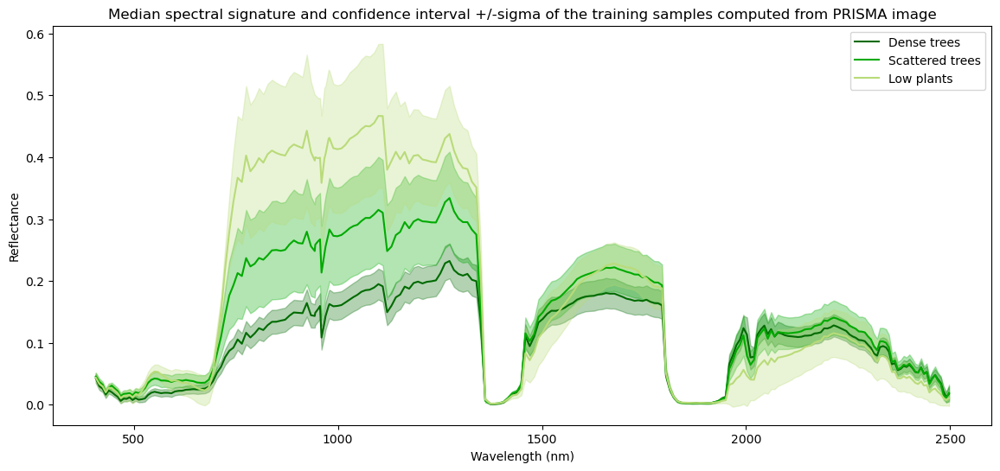

In [19]:
plot_spectral_sign(Sensor.value, wvl, selected_classes, spectral_sign, spectral_sign_std, legend)

## 3.Plot the LCZ classified map 

In [20]:
# Create an interactive widget with the update_plot function
interactive_plot = widgets.interactive(
    update_plot,
    ds_classified_PRI=fixed(ds_classified_PRI),
    ds_classified_S2=fixed(ds_classified_S2),
    sensor=Sensor,
    prisma_date=date_prisma_w,
    s2_date=date_s2_w,
    
)
# Display the interactive widget and plots
display(interactive_plot)

interactive(children=(RadioButtons(description='Select Platform:', layout=Layout(width='max-content'), options…

### Plot  the LCZ from both PRISMA and Sentinel-2 with MapSwipe tool

In [21]:
img1 = LCZ_PR_plot(date_prisma_w.value, ds_classified_PRI)
img2 = LCZ_S2_plot(date_s2_w.value, ds_classified_S2)


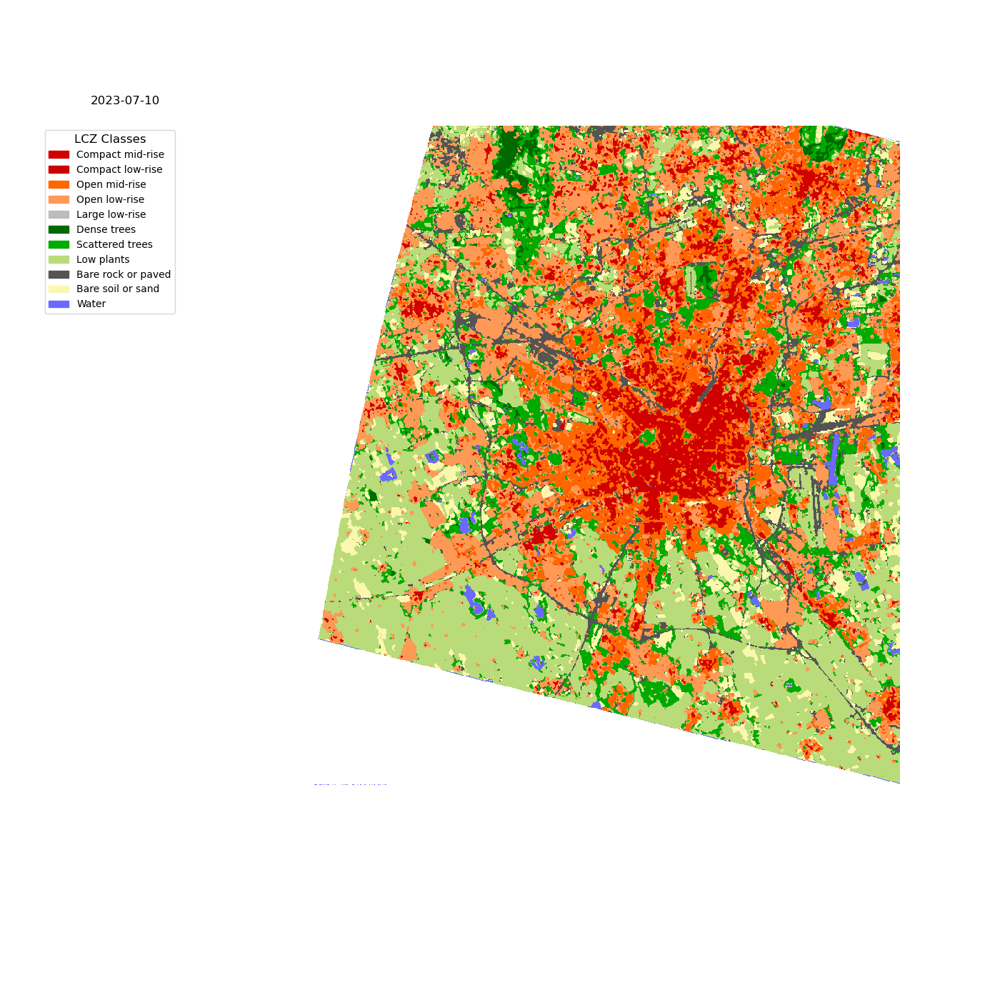
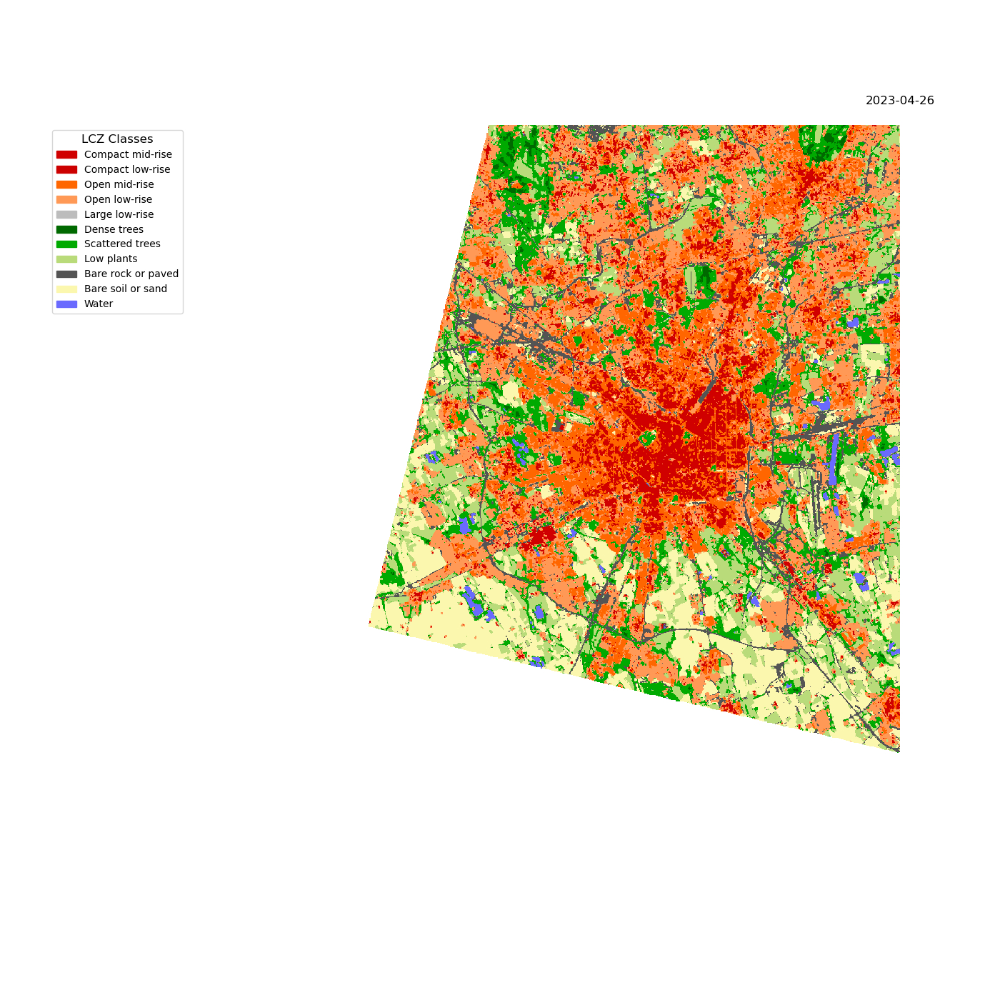

<module 'leafmap' from '/home/asi/.local/lib/python3.8/site-packages/leafmap/__init__.py'>

In [22]:
leafmap.image_comparison(
    img1,
    img2,
    label1='LCZ PRISMA',
    label2='LCZ Sentinel-2',
    starting_position=50,
    
)
leafmap